<a href="https://colab.research.google.com/github/teteumac/ML_Alabama/blob/main/08_autoencoders_and_gans.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Hands On #8

**Chapter 17 – Autoencoders and GANs**

❗️ **This will be very slow, unless you have a GPU (Check the instruction in https://github.com/UAPH4582/PH482_582/blob/main/INSTALL.md).**

❗️ **If you do not, then you should run this notebook in Colab, using a GPU runtime**

<table align="left">
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/UAPH4582/PH482_582_Sp22/blob/main/Exercises/08_autoencoders_and_gans.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
</table>

Due date: 2022-04-11

File name convention: For group 42 and memebers Richard Stallman and Linus Torvalds it would be 
"08_autoencoders_and_gans_group42_Stallman_Torvalds.pdf".

Submission via blackboard (UA) or Google Form (see notion, LPC).

Feel free to answer free text questions in text cells using markdown and possibly $\LaTeX{}$ if you want to.

**You don't have to understand every line of code here and it is not intended for you to try to understand every line of code.   
Big blocks of code are usually meant to just be clicked through.**

# Setup

In [ ]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# TensorFlow ≥2.0 is required
import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2.0"

# Common imports
import numpy as np
import os

# to make this notebook's output stable across runs
np.random.seed(42)
tf.random.set_seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

A couple utility functions to plot grayscale 28x28 image:

In [ ]:
def plot_image(image):
    plt.imshow(image, cmap="binary")
    plt.axis("off")

# Simple linear Autoencoder (=PCA)

Build 3D dataset:

In [ ]:
np.random.seed(4)

def generate_3d_data(m, w1=0.1, w2=0.3, noise=0.1):
    """create some 3d data with noise"""
    angles = np.random.rand(m) * 3 * np.pi / 2 - 0.5
    data = np.empty((m, 3))
    data[:, 0] = np.cos(angles) + np.sin(angles)/2 + noise * np.random.randn(m) / 2
    data[:, 1] = np.sin(angles) * 0.7 + noise * np.random.randn(m) / 2
    data[:, 2] = data[:, 0] * w1 + data[:, 1] * w2 + noise * np.random.randn(m)
    return data

X_train = generate_3d_data(1000)
X_train = X_train - X_train.mean(axis=0, keepdims=0)

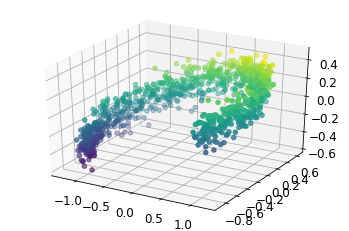

In [ ]:
ax = plt.axes(projection="3d")
ax.scatter3D(X_train[:,0], X_train[:,1], X_train[:,2], c=X_train[:,2], cmap="viridis")

Let's try to "compress" the data using an autoencoder.

As a sidenote: Compression is tightly linked to intelligence and there are even arguments
that compression might be all there is to intelligence.   
If you are interested in this topic you can read about the [Hutter prize](http://prize.hutter1.net/hrules.htm).

Now let's build the Autoencoder...

In [ ]:
np.random.seed(42)
tf.random.set_seed(42)

# encoder: from 3 to 2 dimensions
encoder = keras.models.Sequential([keras.layers.Dense(2, input_shape=[3])])
# decoder: from 2 to 3 dimensions
decoder = keras.models.Sequential([keras.layers.Dense(3, input_shape=[2])])


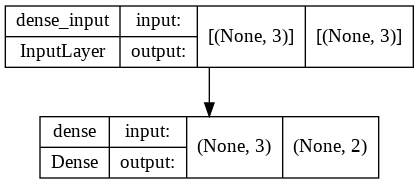

In [ ]:
keras.utils.plot_model(encoder, show_shapes=True)

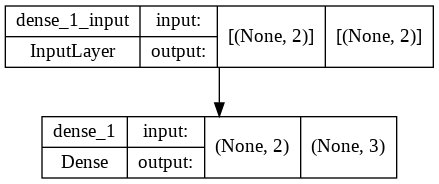

In [ ]:
keras.utils.plot_model(decoder, show_shapes=True)

## Task 1: 
If you don't understand autoencoders, we strongly recommend reading the parts in the book (Chapter 17) first.

a) Build an autoencoder model with the two subcomponents: the encoder and the decoder. All you have to do is to "stack" the encoder and decoder, `[encoder, decoder]` in a `keras.models.Sequential`.   
b) Compile the model with `mse` loss and SGD optimizer with `lr=1`.   
c) Train the model (20 epochs) on the dataset created above. Think about what `X` and `y` need to be for training the autoencoder. Remember that you want to reconstruct the input with an autoencoder.       
d) Encode the dataset using only the trained encoder. The `encoder` will be mutated by the autoencoder training, so you can just use it to do this step because it is already trained. Call the output `codings` for the plotting code below.   
e) Look at the plot of the encodings and explain the purpose of this encoder.    
f) Decode the encodings again and plot them in 3D using the same code as above when we plot `X_train`.


↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓ your code goes below

In [ ]:
autoencoder = keras.models.Sequential([encoder, decoder])

In [ ]:
autoencoder.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=1.), loss="mse")

In [ ]:
history = autoencoder.fit(X_train, X_train, epochs=20)

Epoch 1/20
32/32 [==============================] - 1s 3ms/step - loss: 0.0548
Epoch 2/20
32/32 [==============================] - 0s 3ms/step - loss: 0.0076
Epoch 3/20
32/32 [==============================] - 0s 3ms/step - loss: 0.0046
Epoch 4/20
32/32 [==============================] - 0s 4ms/step - loss: 0.0041
Epoch 5/20
32/32 [==============================] - 0s 3ms/step - loss: 0.0049
Epoch 6/20
32/32 [==============================] - 0s 4ms/step - loss: 0.0039
Epoch 7/20
32/32 [==============================] - 0s 3ms/step - loss: 0.0035
Epoch 8/20
32/32 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 9/20
32/32 [==============================] - 0s 2ms/step - loss: 0.0034
Epoch 10/20
32/32 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 11/20
32/32 [==============================] - 0s 3ms/step - loss: 0.0034
Epoch 12/20
32/32 [==============================] - 0s 3ms/step - loss: 0.0032
Epoch 13/20
32/32 [==============================

In [ ]:
codings = encoder.predict(X_train)

↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑ your code goes above

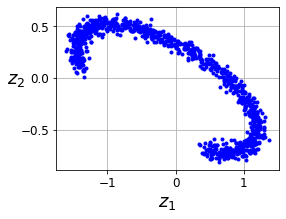

In [ ]:
fig = plt.figure(figsize=(4,3))
plt.plot(codings[:,0], codings[:, 1], "b.")
plt.xlabel("$z_1$", fontsize=18)
plt.ylabel("$z_2$", fontsize=18, rotation=0)
plt.grid(True)
plt.show()

**Task 1 e)** This encoder acts exactly as a PCA, it projects the 3D data in a 2D plane, preserving as much variance in the data as it could. Below, by the using of the whole autoencoder, it projects again the 2D data in the 3D space. 

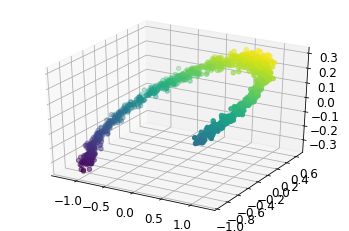

In [ ]:
decoding = decoder.predict(codings)
ax2 = plt.axes(projection="3d")
ax2.scatter3D(decoding[:,0], decoding[:,1], decoding[:,2], c=decoding[:,2], cmap="viridis")

# Autoencoder for MNIST
Let's use the MNIST dataset.

In [ ]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.fashion_mnist.load_data()
X_train_full = X_train_full.astype(np.float32) / 255
X_test = X_test.astype(np.float32) / 255
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

Let's build a stacked Autoencoder with 3 hidden layers and 1 output layer (i.e., 2 stacked Autoencoders).

In [ ]:
encoder2 = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu"),
])

## Task 2: 
a) Above the code for the encoder is given. Build the corresponding decoder (`decoder2`). The last layer of the decoder will have to be `keras.layers.Reshape([28, 28])`. Just like in task 1, build `autoencoder2` from `encoder2` and `decoder`.   
b) Compile the model using binary cross entropy,  SGD optimizer with `lr=1.0` and `accuracy` as metrics.   
c) Train the model using `X_train` (10 epochs) as both the inputs and the targets (and similarly, use `X_valid` as both the validation inputs and targets).    
d) Using the function `show_reconstructions` below, look at the reconstructions and comment on them.   
e) Run these 2 commands:
`X_train[0].shape` and  `encoder2.predict(X_train[0:1])[0].shape` and explain their outputs.

In [ ]:
def show_reconstructions(model, images=X_valid, n_images=5):
    reconstructions = model.predict(images[:n_images])
    fig = plt.figure(figsize=(n_images * 1.5, 3))
    for image_index in range(n_images):
        plt.subplot(2, n_images, 1 + image_index)
        plot_image(images[image_index])
        plt.subplot(2, n_images, 1 + n_images + image_index)
        plot_image(reconstructions[image_index])

↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓ your code goes below

In [ ]:
decoder2 = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])

In [ ]:
autoencoder2 = keras.models.Sequential([encoder2, decoder2])

In [ ]:
autoencoder2.compile(loss="binary_crossentropy",
                   optimizer=keras.optimizers.SGD(learning_rate=1.), metrics=["accuracy"])

In [ ]:
history = autoencoder2.fit(X_train, X_train, epochs=10,
                         validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 16s 9ms/step - loss: 0.3463 - accuracy: 0.0786 - val_loss: 0.3208 - val_accuracy: 0.0926
Epoch 2/10
1719/1719 [==============================] - 14s 8ms/step - loss: 0.3095 - accuracy: 0.0965 - val_loss: 0.3062 - val_accuracy: 0.1002
Epoch 3/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.3019 - accuracy: 0.1061 - val_loss: 0.3017 - val_accuracy: 0.1121
Epoch 4/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.2979 - accuracy: 0.1130 - val_loss: 0.2977 - val_accuracy: 0.1150
Epoch 5/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.2949 - accuracy: 0.1178 - val_loss: 0.2950 - val_accuracy: 0.1188
Epoch 6/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.2924 - accuracy: 0.1226 - val_loss: 0.2934 - val_accuracy: 0.1240
Epoch 7/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.2906 - accuracy: 0.1271 - val_loss: 0.2913 - val_accura

In [ ]:
autoencoder2.evaluate(X_test,X_test)

313/313 [==============================] - 1s 3ms/step - loss: 0.2887 - accuracy: 0.1429


[0.2886798083782196, 0.1429285705089569]

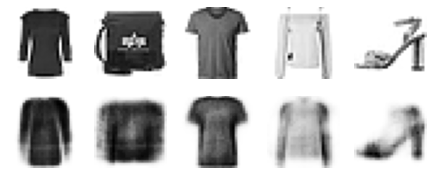

In [ ]:
show_reconstructions(autoencoder2)

**Task 2d)** The reconstructions are not very good, probably we need to train the model for more epochs, or make the model more complex. But we need to be careful to not make a perfect reconstruction, meaning that the model are decorating the pictures and it is not learning from data.

In [ ]:
X_train[0].shape

(28, 28)

In [ ]:
encoder2.predict(X_train[0:1])[0].shape

(30,)

**Task 2e)** The shape of the input images is a 28 x 28 matrix, the enconder2 model is encoding the input to a 30 neurons layer. The decoder transform is back to a 28 x 28 matrix shape.

↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑ your code goes above

### "Looking" at the encoding
Here we wil in some sense "look" at the encoding.
We will use TSNE to transform the encoding to 2D and then plot in a 2D plane.

No questions to anwer here, just look at the plots.

In [ ]:
from sklearn.manifold import TSNE

X_valid_compressed = encoder2.predict(X_valid)
tsne = TSNE()
X_valid_2D = tsne.fit_transform(X_valid_compressed)
X_valid_2D = (X_valid_2D - X_valid_2D.min()) / (X_valid_2D.max() - X_valid_2D.min())

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


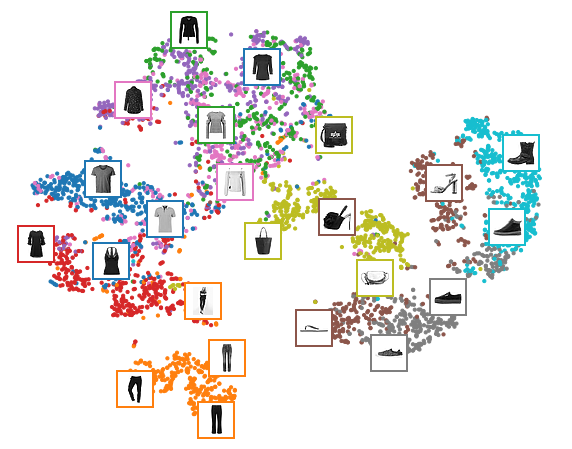

In [ ]:
# adapted from https://scikit-learn.org/stable/auto_examples/manifold/plot_lle_digits.html
plt.figure(figsize=(10, 8))
cmap = plt.cm.tab10
plt.scatter(X_valid_2D[:, 0], X_valid_2D[:, 1], c=y_valid, s=10, cmap=cmap)
image_positions = np.array([[1., 1.]])
for index, position in enumerate(X_valid_2D):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 0.02: # if far enough from other images
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(X_valid[index], cmap="binary"),
            position, bboxprops={"edgecolor": cmap(y_valid[index]), "lw": 2})
        plt.gca().add_artist(imagebox)
plt.axis("off")
plt.show()

## Using Convolutional Layers Instead of Dense Layers

Let's build a stacked Autoencoder with 3 hidden layers and 1 output layer (i.e., 2 stacked Autoencoders).

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

conv_encoder = keras.models.Sequential([
    keras.layers.Reshape([28, 28, 1], input_shape=[28, 28]),
    keras.layers.Conv2D(16, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2),
    keras.layers.Conv2D(32, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2),
    keras.layers.Conv2D(64, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2)
])
conv_decoder = keras.models.Sequential([
    keras.layers.Conv2DTranspose(32, kernel_size=3, strides=2, padding="VALID", activation="selu",
                                 input_shape=[3, 3, 64]),
    keras.layers.Conv2DTranspose(16, kernel_size=3, strides=2, padding="SAME", activation="selu"),
    keras.layers.Conv2DTranspose(1, kernel_size=3, strides=2, padding="SAME", activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])


In [ ]:
conv_encoder.summary()
conv_decoder.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_1 (Reshape)         (None, 28, 28, 1)         0         
                                                                 
 conv2d (Conv2D)             (None, 28, 28, 16)        160       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 7, 7, 32)         0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 7, 7, 64)         

In [ ]:
!pip install visualkeras

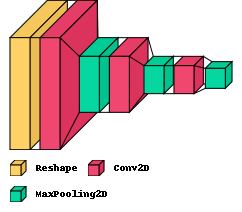

In [ ]:
import visualkeras
# depending on your installation you might have to run `pip install visualkeras` (in a separate cell)
visualkeras.layered_view(conv_encoder, legend=True)

Above is a visual representation of the encoder. Alas visualkeras does not support `Conv2

### Task 3:
a) Build an autoencoder model with the two subcomponents: the convolutional encoder and the convolutional decoder.   
b) Compile the model using binary cross entropy,  SGD optimizer with lr=1.0 and `[accuracy]` as metrics.   
c) Train the model using X_train (10 epochs) as both the inputs and the targets (and similarly, use X_valid as both the validation inputs and targets).    
d) Is the CNN autoencoder better than dense layer's autoencoders? Why?   
e) What is the shape/size of the input and what is the shape/size of the encoding? Compare to the autoencoder above. (This is similar to task 2e)

↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓ your code goes below

In [ ]:
conv_autoencoder = keras.models.Sequential([conv_encoder, conv_decoder])

In [ ]:
conv_autoencoder.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0),
                metrics=["accuracy"])

In [ ]:
history = conv_autoencoder.fit(X_train, X_train, epochs=10,
                              validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 93s 53ms/step - loss: 0.3018 - accuracy: 0.1671 - val_loss: 0.2845 - val_accuracy: 0.1995
Epoch 2/10
1719/1719 [==============================] - 69s 40ms/step - loss: 0.2756 - accuracy: 0.2199 - val_loss: 0.2729 - val_accuracy: 0.2367
Epoch 3/10
1719/1719 [==============================] - 70s 41ms/step - loss: 0.2708 - accuracy: 0.2466 - val_loss: 0.2696 - val_accuracy: 0.2539
Epoch 4/10
1719/1719 [==============================] - 69s 40ms/step - loss: 0.2682 - accuracy: 0.2631 - val_loss: 0.2685 - val_accuracy: 0.2751
Epoch 5/10
1719/1719 [==============================] - 69s 40ms/step - loss: 0.2664 - accuracy: 0.2746 - val_loss: 0.2672 - val_accuracy: 0.2906
Epoch 6/10
1719/1719 [==============================] - 69s 40ms/step - loss: 0.2651 - accuracy: 0.2834 - val_loss: 0.2661 - val_accuracy: 0.2752
Epoch 7/10
1719/1719 [==============================] - 69s 40ms/step - loss: 0.2640 - accuracy: 0.2900 - val_loss: 0.2648 -

In [ ]:
conv_autoencoder.evaluate(X_test,X_test)

313/313 [==============================] - 6s 19ms/step - loss: 0.2630 - accuracy: 0.3120


[0.2630241811275482, 0.31198570132255554]

↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑ your code goes above

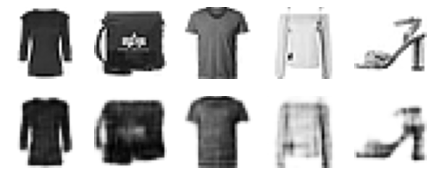

In [ ]:
show_reconstructions(conv_autoencoder)
plt.show()

**Task 3 d)** The CNN autoencoder is better than the dense layer's autoencoder. The reconstruction obtained are more clear and the accuracy is higher. It happens because de CNN are better to deal with images than the pure dense layers.

In [ ]:
X_train[0].shape

(28, 28)

In [ ]:
conv_encoder.predict(X_train[0:1])[0].shape

(3, 3, 64)

The input is the same as above, a 28 x 28 matrix. In the encoder, the image is a 3 x 3 x 64 tensor, with 576 parameters, so it keeps more information than the pure dense layers.

# Denoising Autoencoder

Below we have a similar autoencoder as before, but with an extra `GaussianNoise` layer directly after the input.

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

denoising_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.GaussianNoise(0.2),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu")
])
denoising_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])

### Task 4:
a) Build an autoencoder model with the two subcomponents: the encoder and the decoder.   
b) Compile the model using binary cross entropy,  SGD optimizer with lr=1.0 and `rounded_accuracy` as metrics.   
c) Train the model using X_train (10 epochs) as both the inputs and the targets (and similarly, use X_valid as both the validation inputs and targets).    
d) Explain why adding Gaussian noise to the input would help the autoencoder to learn.   

↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓ your code goes below

In [ ]:
def rounded_accuracy(y_true, y_pred):
    return keras.metrics.binary_accuracy(tf.round(y_true), tf.round(y_pred))

denoising_ae = keras.models.Sequential([denoising_encoder,denoising_decoder])
denoising_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0),
                metrics=[rounded_accuracy])
history = denoising_ae.fit(X_train, X_train, epochs=10, validation_data=[X_train,X_train])

Epoch 1/10
1719/1719 [==============================] - 28s 15ms/step - loss: 0.3500 - rounded_accuracy: 0.8773 - val_loss: 0.3146 - val_rounded_accuracy: 0.9084
Epoch 2/10
1719/1719 [==============================] - 14s 8ms/step - loss: 0.3120 - rounded_accuracy: 0.9097 - val_loss: 0.3070 - val_rounded_accuracy: 0.9159
Epoch 3/10
1719/1719 [==============================] - 14s 8ms/step - loss: 0.3060 - rounded_accuracy: 0.9148 - val_loss: 0.3015 - val_rounded_accuracy: 0.9184
Epoch 4/10
1719/1719 [==============================] - 14s 8ms/step - loss: 0.3025 - rounded_accuracy: 0.9179 - val_loss: 0.2981 - val_rounded_accuracy: 0.9221
Epoch 5/10
1719/1719 [==============================] - 14s 8ms/step - loss: 0.2996 - rounded_accuracy: 0.9205 - val_loss: 0.2955 - val_rounded_accuracy: 0.9242
Epoch 6/10
1719/1719 [==============================] - 14s 8ms/step - loss: 0.2974 - rounded_accuracy: 0.9223 - val_loss: 0.2941 - val_rounded_accuracy: 0.9271
Epoch 7/10
1719/1719 [===========

↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑ your code goes above

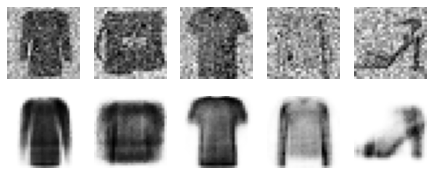

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

noise = keras.layers.GaussianNoise(0.2)
show_reconstructions(denoising_ae, noise(X_valid, training=True))
plt.show()

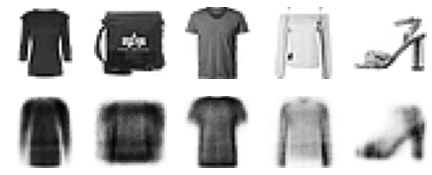

In [ ]:
show_reconstructions(denoising_ae, X_valid)   # denoising autoencoder applied to "sharp" images
plt.show()

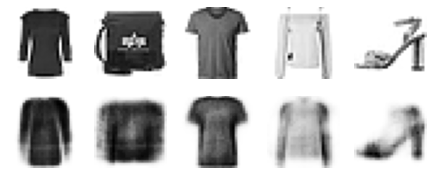

In [ ]:
show_reconstructions(autoencoder2, X_valid)   # original autoencoder without Gaussian noise
plt.show()

**Task 4 d)**  By the adding of gaussian noise, the autoencoder guesses details that are actually not in the input. Also, the autoencoders can be used quite simply and efficiently to remove noise from images.

# Variational Autoencoder

### Task 5:
Below you see the implementation of a variational autoencoder.   

a) Explain how a variational autoencoder works. What are the differences to a normal autoencoder?   
b) Explain how you would "generate" new data with a variational autoencoder.

↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓ your code goes below

Task 5a) answer: There are two main differences in variational autoencoders when compared with a normal one: they are probabilistic autoencoders, meaning that their outputs are partly determined by chance, even after training (as opposed to denoising autoencoders, which use randomness only during training). Also they are generative autoencoders, meaning that they can generate new instances that look like they were sampled from the training set.

Task 5b) answer: After training a variational autoencoder, it is possible to generate new data just by sampling a random coding from the Gaussian distribution and then decode it.

↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑ your code goes above

In [ ]:
K = keras.backend
kl_divergence = keras.losses.kullback_leibler_divergence

class KLDivergenceRegularizer(keras.regularizers.Regularizer):
    def __init__(self, weight, target=0.1):
        self.weight = weight
        self.target = target
    def __call__(self, inputs):
        mean_activities = K.mean(inputs, axis=0)
        return self.weight * (
            kl_divergence(self.target, mean_activities) +
            kl_divergence(1. - self.target, 1. - mean_activities))

In [ ]:
class Sampling(keras.layers.Layer):
    def call(self, inputs):
        mean, log_var = inputs
        return K.random_normal(tf.shape(log_var)) * K.exp(log_var / 2) + mean

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

codings_size = 10

inputs = keras.layers.Input(shape=[28, 28])
z = keras.layers.Flatten()(inputs)
z = keras.layers.Dense(150, activation="selu")(z)
z = keras.layers.Dense(100, activation="selu")(z)
codings_mean = keras.layers.Dense(codings_size)(z)
codings_log_var = keras.layers.Dense(codings_size)(z)
codings = Sampling()([codings_mean, codings_log_var])
variational_encoder = keras.models.Model(
    inputs=[inputs], outputs=[codings_mean, codings_log_var, codings])

decoder_inputs = keras.layers.Input(shape=[codings_size])
x = keras.layers.Dense(100, activation="selu")(decoder_inputs)
x = keras.layers.Dense(150, activation="selu")(x)
x = keras.layers.Dense(28 * 28, activation="sigmoid")(x)
outputs = keras.layers.Reshape([28, 28])(x)
variational_decoder = keras.models.Model(inputs=[decoder_inputs], outputs=[outputs])

_, _, codings = variational_encoder(inputs)
reconstructions = variational_decoder(codings)
variational_ae = keras.models.Model(inputs=[inputs], outputs=[reconstructions])

latent_loss = -0.5 * K.sum(
    1 + codings_log_var - K.exp(codings_log_var) - K.square(codings_mean),
    axis=-1)
variational_ae.add_loss(K.mean(latent_loss) / 784.)

In [ ]:
variational_ae.compile(loss="binary_crossentropy", optimizer="rmsprop", metrics=["accuracy"])
history = variational_ae.fit(X_train, X_train, epochs=25, 
                             validation_data=(X_valid, X_valid))

Epoch 1/25
1719/1719 [==============================] - 20s 11ms/step - loss: 0.3531 - accuracy: 0.0882 - val_loss: 0.3364 - val_accuracy: 0.1077
Epoch 2/25
1719/1719 [==============================] - 18s 10ms/step - loss: 0.3263 - accuracy: 0.1093 - val_loss: 0.3240 - val_accuracy: 0.1097
Epoch 3/25
1719/1719 [==============================] - 17s 10ms/step - loss: 0.3212 - accuracy: 0.1197 - val_loss: 0.3229 - val_accuracy: 0.1259
Epoch 4/25
1719/1719 [==============================] - 17s 10ms/step - loss: 0.3187 - accuracy: 0.1258 - val_loss: 0.3214 - val_accuracy: 0.1241
Epoch 5/25
1719/1719 [==============================] - 17s 10ms/step - loss: 0.3171 - accuracy: 0.1300 - val_loss: 0.3233 - val_accuracy: 0.1315
Epoch 6/25
1719/1719 [==============================] - 17s 10ms/step - loss: 0.3159 - accuracy: 0.1333 - val_loss: 0.3167 - val_accuracy: 0.1312
Epoch 7/25
1719/1719 [==============================] - 17s 10ms/step - loss: 0.3151 - accuracy: 0.1354 - val_loss: 0.3163 -

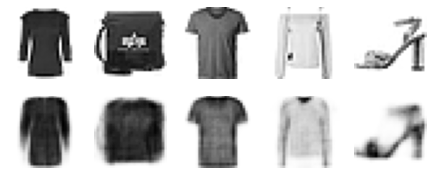

In [ ]:
show_reconstructions(variational_ae)
plt.show()

## Generate Fashion Images
Now that we have a variational autoencoder, we can use it to generate fashion images.

In [ ]:
def plot_multiple_images(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = np.squeeze(images, axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

Let's generate a few random codings, decode them and plot the resulting images:

### Task 6:
a) Take the encoding of the first image `X_train[0:1]` and add multiples (-10 to 10) of `np.array([0, 0, 1, 0, 0, 0, 0, 0, 0, 0])`. Decode and plot using `plot_multiple_images()`. Hint: The output of `variational_encoder` is `[codings_mean, codings_log_var, codings]` and you only need the codings, not the mean and var.   
b) Generate few (e.g. 12) random codings using for example [tf.random.normal](https://www.tensorflow.org/api_docs/python/tf/random/normal). Decode them and plot the resulting images using `plot_multiple_images(images, 4)`:

↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓ your code goes below

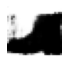

In [ ]:
import random
image = variational_encoder.predict(X_train[0:1])

image = np.array(image)
image = image + random.randrange(-10, +10)*np.array([0, 0, 1, 0, 0, 0, 0, 0, 0, 0])
image_decoder = variational_decoder(image[0,:]).numpy()
plot_multiple_images(image_decoder)

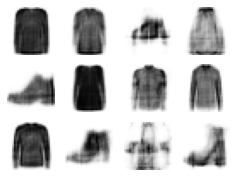

In [ ]:
codings = tf.random.normal(shape=[12, codings_size])
images = variational_decoder(codings).numpy()
plot_multiple_images(images, 4)

↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑ your code goes above

Now let's perform semantic interpolation between these images:

# Generative Adversarial Networks

### Task 7:
Look at the GAN implementation below.   
a) Explain what a Generative Adversarial Network does.   
b) Run the code below. During every epoch it plots a few images. Comment on the "progress" from epoch 1 to 50.
The training takes a very long time, you can also simply go to [this link](https://github.com/ageron/handson-ml2/blob/master/17_autoencoders_and_gans.ipynb) and
look at the output under the section "Generative Adversarial Networks".

↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓ your code goes below

Task 7 a) answer: A GAN has two main structures:

Generative: it takes a random distribution as input (typically Gaussian) and outputs some data—typically, an image. 
Discriminator: Takes either a fake image from the generator or a real image from the training set as input, and must guess whether the input image is fake or real. 
During training, the generator and the discriminator have opposite goals: the discriminator tries to tell fake images from real images, while the generator tries to produce images that look real enough to trick the discriminator.

Task 7b) answer: The "progress" from epochs 1 to 50 is visible. The algorithm is producing better imagens, at each step with less pixel "holes" than before.

↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑ your code goes above

In [ ]:
np.random.seed(42)
tf.random.set_seed(42)

codings_size = 30

generator = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[codings_size]),
    keras.layers.Dense(150, activation="selu"),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
discriminator = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(150, activation="selu"),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(1, activation="sigmoid")
])


In [ ]:
gan = keras.models.Sequential([generator, discriminator])
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [ ]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

In [ ]:
def train_gan(gan, dataset, batch_size, codings_size, n_epochs=50):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))
        for X_batch in dataset:
            # phase 1 - training the discriminator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0)
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
            discriminator.trainable = True
            discriminator.train_on_batch(X_fake_and_real, y1)
            # phase 2 - training the generator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            y2 = tf.constant([[1.]] * batch_size)
            discriminator.trainable = False
            gan.train_on_batch(noise, y2)
        plot_multiple_images(generated_images, 8)
        plt.show()

Epoch 1/1


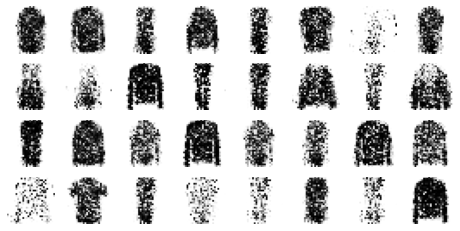

In [ ]:
train_gan(gan, dataset, batch_size, codings_size, n_epochs=1)

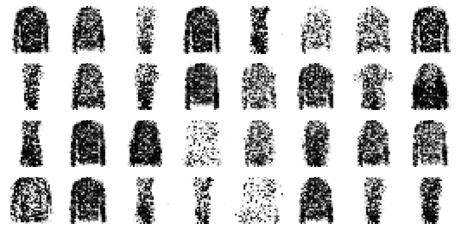

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

noise = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator(noise)
plot_multiple_images(generated_images, 8)

Epoch 1/50


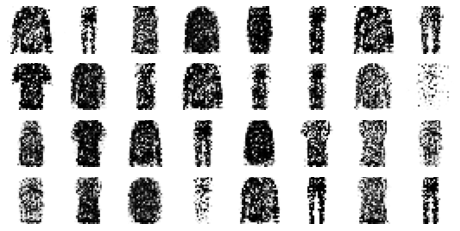

Epoch 2/50


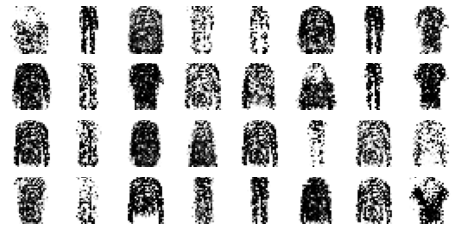

Epoch 3/50


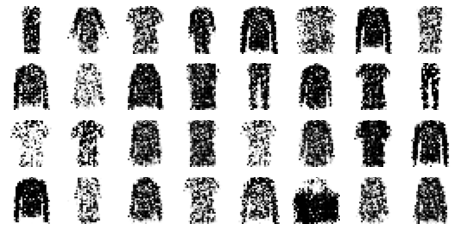

Epoch 4/50


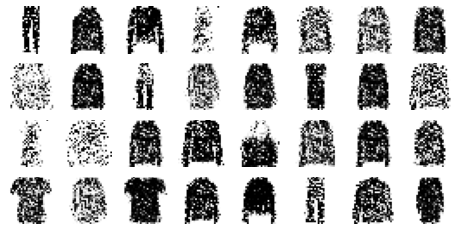

Epoch 5/50


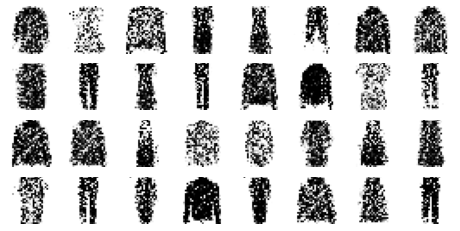

Epoch 6/50


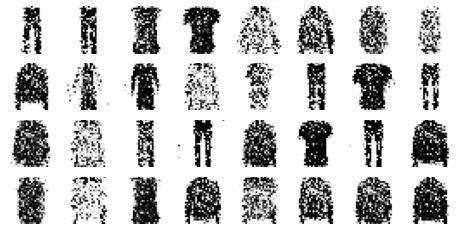

Epoch 7/50


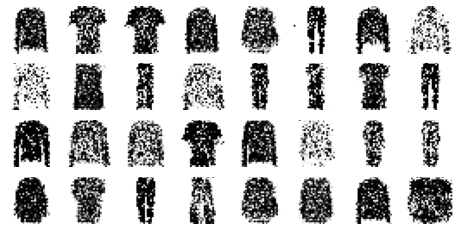

Epoch 8/50


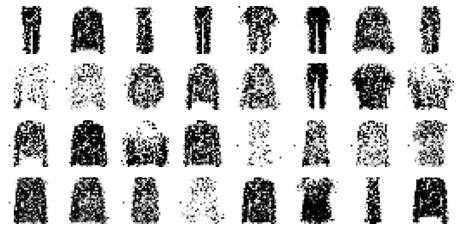

Epoch 9/50


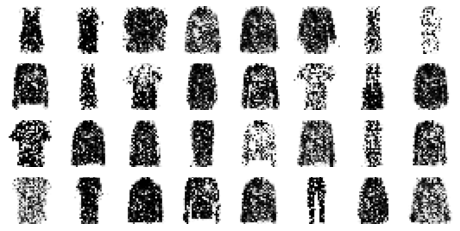

Epoch 10/50


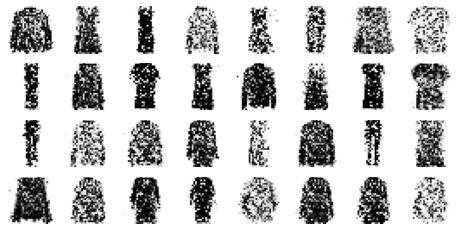

Epoch 11/50


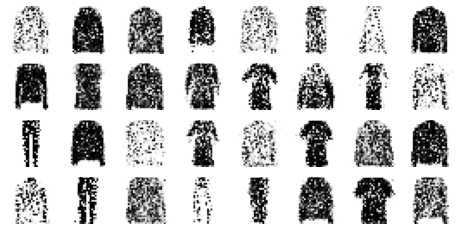

Epoch 12/50


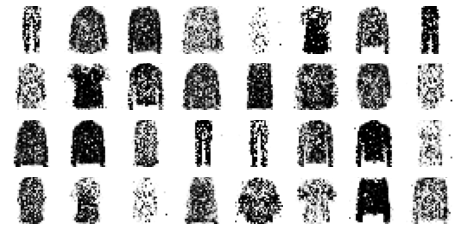

Epoch 13/50


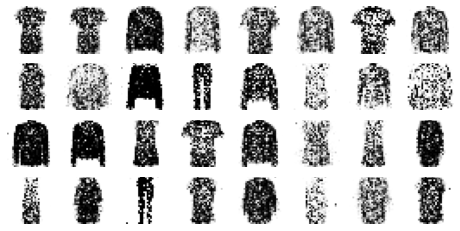

Epoch 14/50


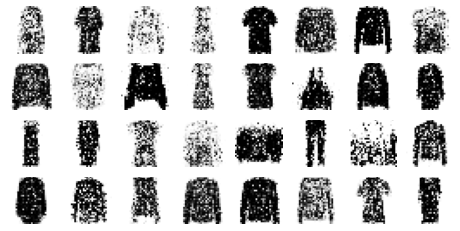

Epoch 15/50


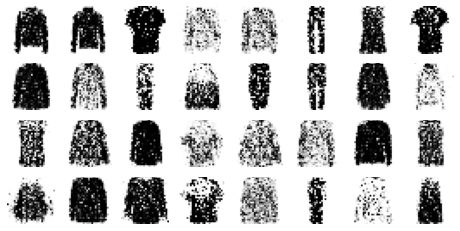

Epoch 16/50


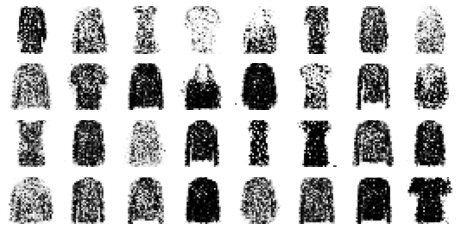

Epoch 17/50


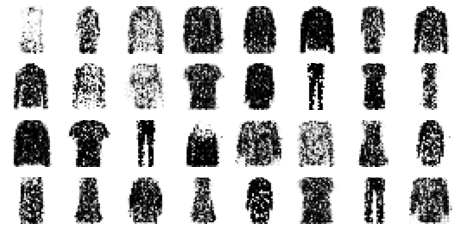

Epoch 18/50


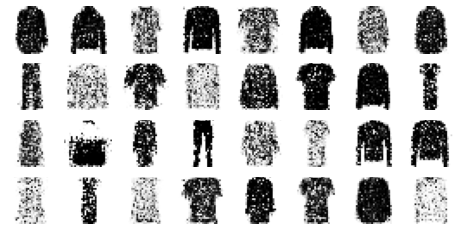

Epoch 19/50


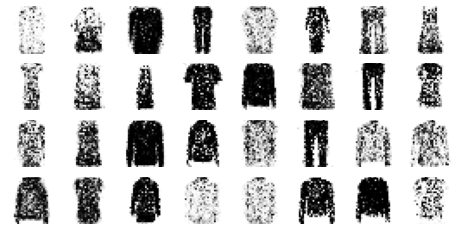

Epoch 20/50


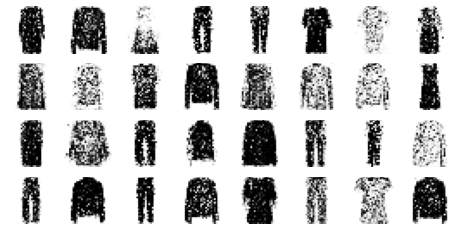

Epoch 21/50


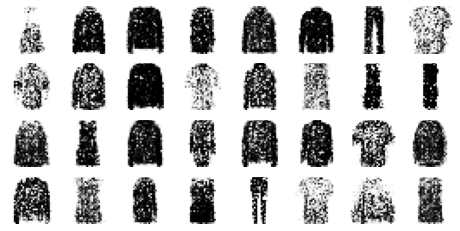

Epoch 22/50


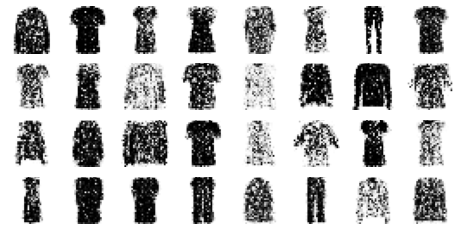

Epoch 23/50


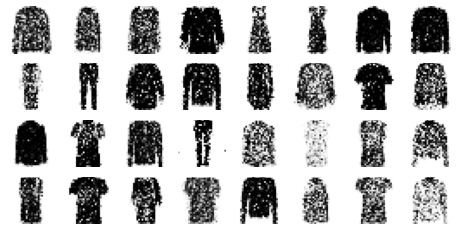

Epoch 24/50


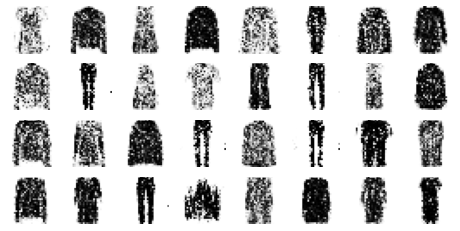

Epoch 25/50


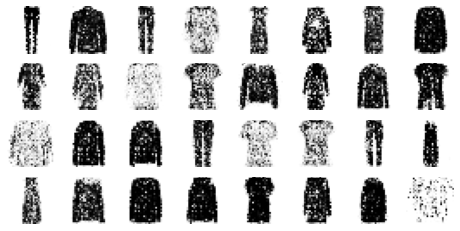

Epoch 26/50


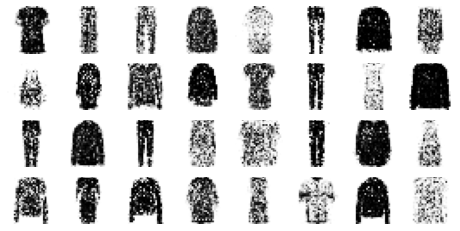

Epoch 27/50


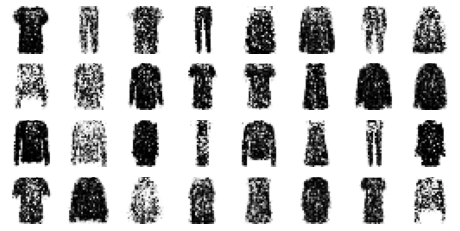

Epoch 28/50


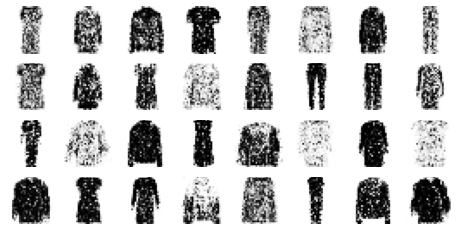

Epoch 29/50


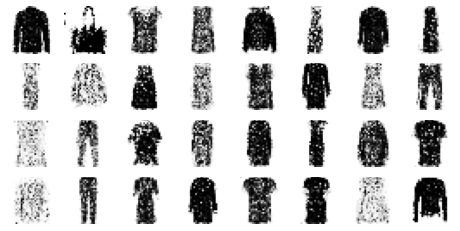

Epoch 30/50


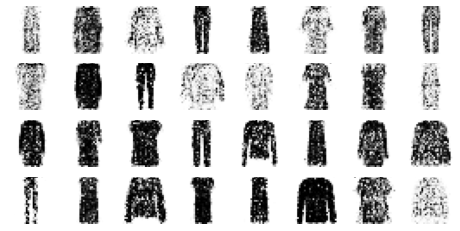

Epoch 31/50


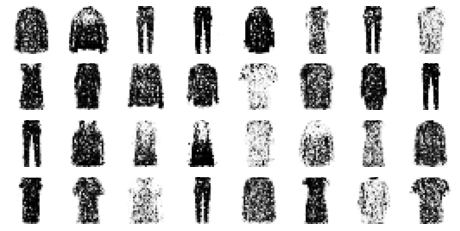

Epoch 32/50


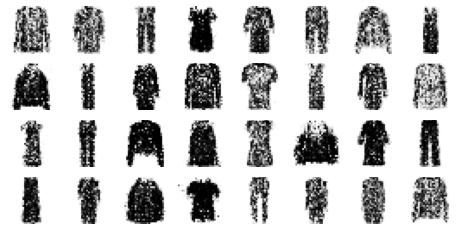

Epoch 33/50


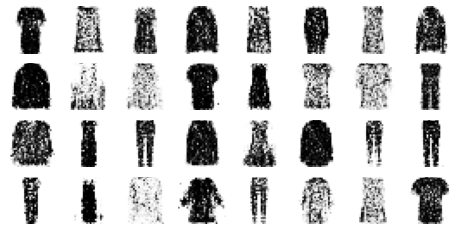

Epoch 34/50


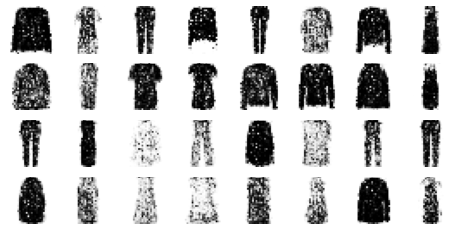

Epoch 35/50


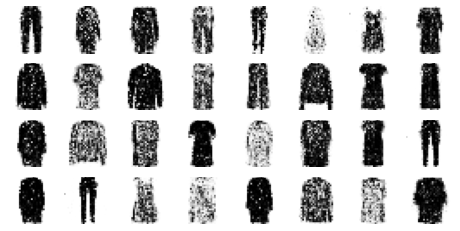

Epoch 36/50


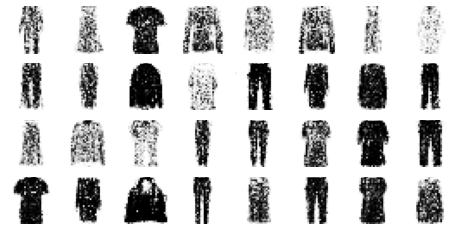

Epoch 37/50


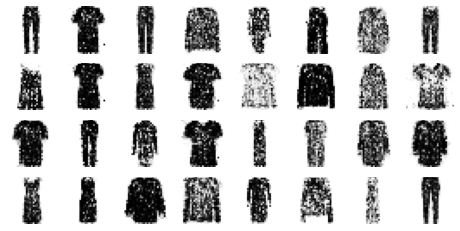

Epoch 38/50


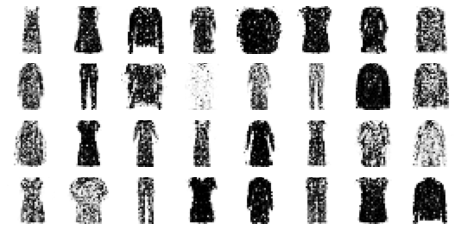

Epoch 39/50


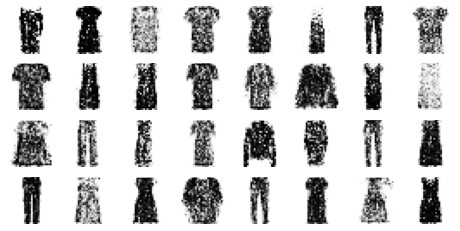

Epoch 40/50


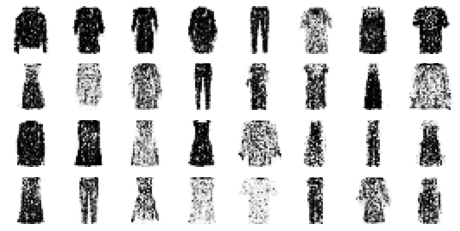

Epoch 41/50


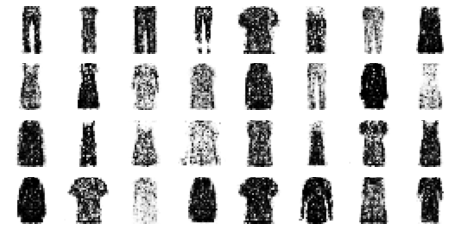

Epoch 42/50


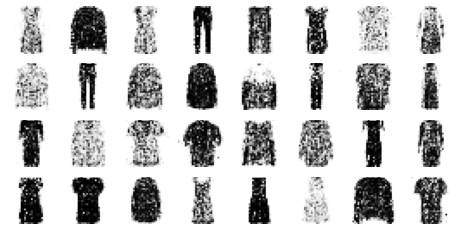

Epoch 43/50


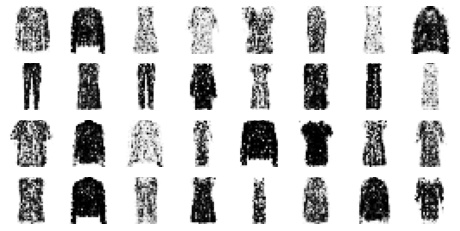

Epoch 44/50


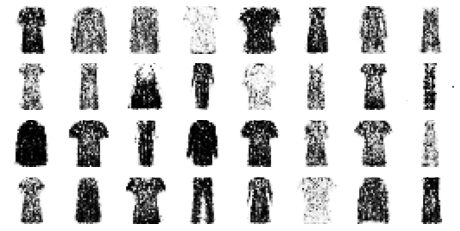

Epoch 45/50


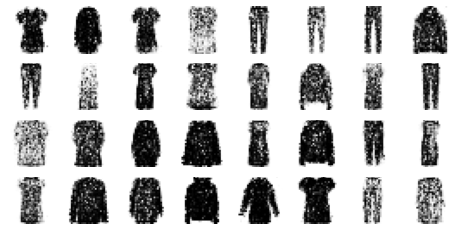

Epoch 46/50


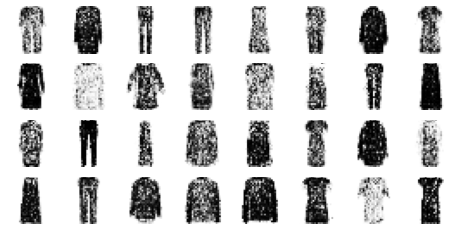

Epoch 47/50


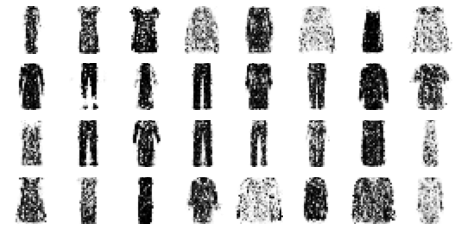

Epoch 48/50


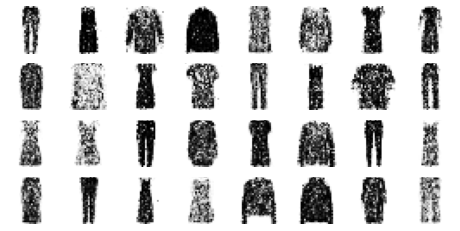

Epoch 49/50


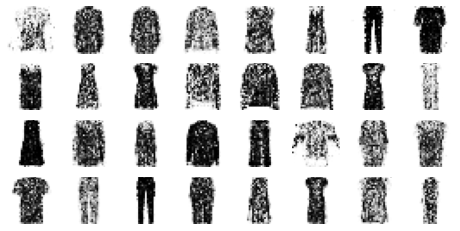

Epoch 50/50


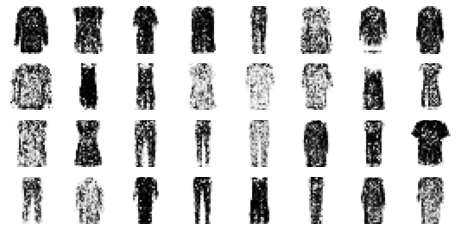

In [ ]:
train_gan(gan, dataset, batch_size, codings_size)

# Deep Convolutional GAN
This is the convolutional variant of the GAN. Again, you can simply look at the ouptut from the [link](https://github.com/ageron/handson-ml2/blob/master/17_autoencoders_and_gans.ipynb).

### Task 8:
a) Comment on the training progress of the Deep Convolutional GAN.   
b) Compare the results from the Deep Convolutional GAN with the results from task 7.

↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓ your code goes below

Task 8 a) answer: The Deep Convolutional GAN are GANs improved by: 
Replacing any pooling layers with strided convolutions (in the discriminator) and transposed convolutions (in the generator).
Using Batch Normalization in both the generator and the discriminator, except in the generator’s output layer and the discriminator’s input layer.
Removing fully connected hidden layers for deeper architectures.
Using ReLU activation in the generator for all layers except the output layer, which should use tanh.
Using leaky ReLU activation in the discriminator for all layers.

Task 8b) answer: The imagens produced by Deep Convolutional GANs are very more convincing than the results from task 7

↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑↑ your code goes above

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

codings_size = 100

generator = keras.models.Sequential([
    keras.layers.Dense(7 * 7 * 128, input_shape=[codings_size]),
    keras.layers.Reshape([7, 7, 128]),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="SAME",
                                 activation="selu"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(1, kernel_size=5, strides=2, padding="SAME",
                                 activation="tanh"),
])
discriminator = keras.models.Sequential([
    keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="SAME",
                        activation=keras.layers.LeakyReLU(0.2),
                        input_shape=[28, 28, 1]),
    keras.layers.Dropout(0.4),
    keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="SAME",
                        activation=keras.layers.LeakyReLU(0.2)),
    keras.layers.Dropout(0.4),
    keras.layers.Flatten(),
    keras.layers.Dense(1, activation="sigmoid")
])
gan = keras.models.Sequential([generator, discriminator])

In [ ]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [ ]:
X_train_dcgan = X_train.reshape(-1, 28, 28, 1) * 2. - 1. # reshape and rescale

In [ ]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train_dcgan)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

Epoch 1/50


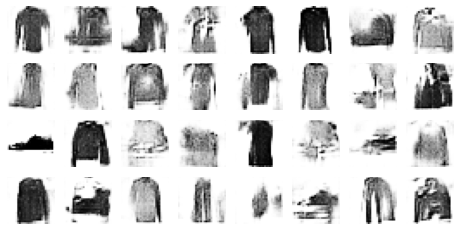

Epoch 2/50


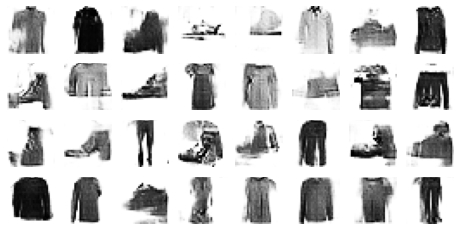

Epoch 3/50


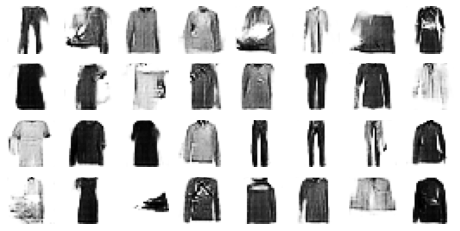

Epoch 4/50


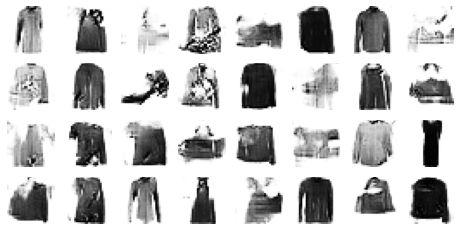

Epoch 5/50


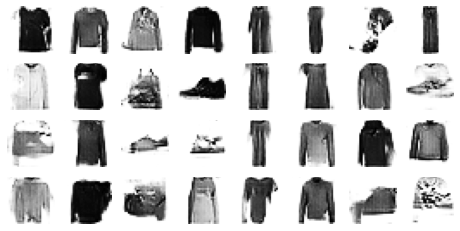

Epoch 6/50


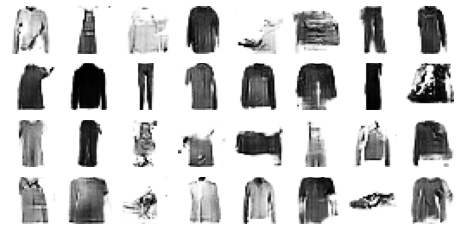

Epoch 7/50


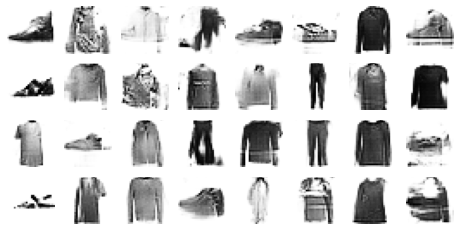

Epoch 8/50


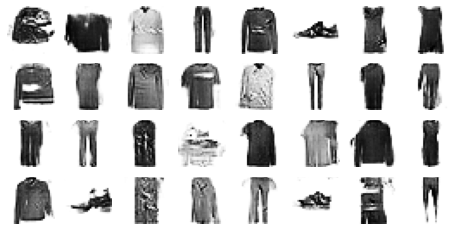

Epoch 9/50


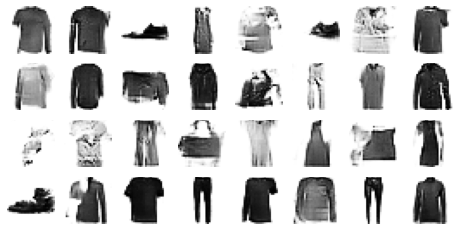

Epoch 10/50


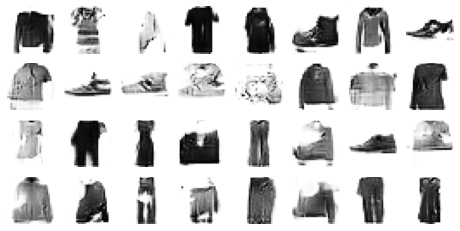

Epoch 11/50


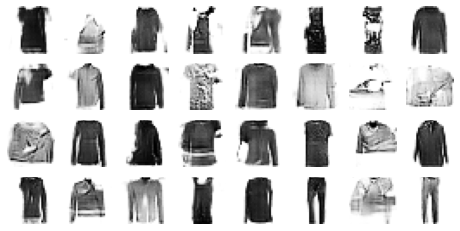

Epoch 12/50


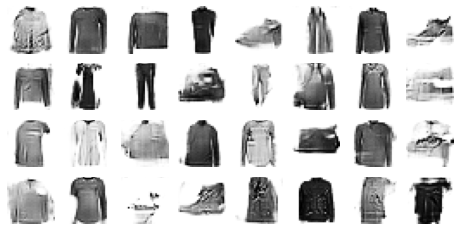

Epoch 13/50


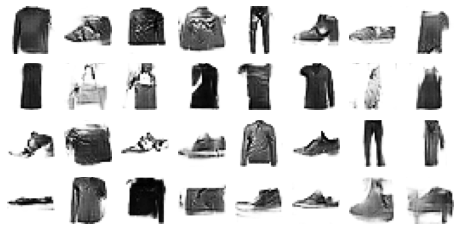

Epoch 14/50


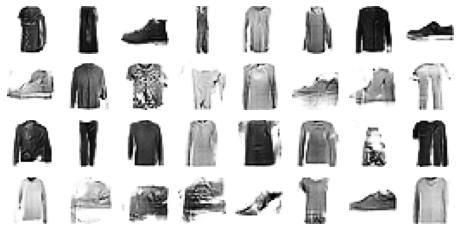

Epoch 15/50


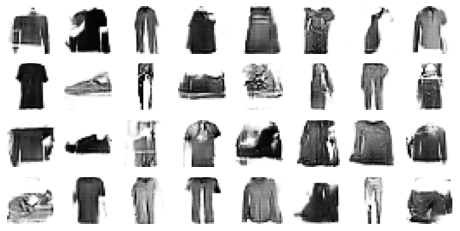

Epoch 16/50


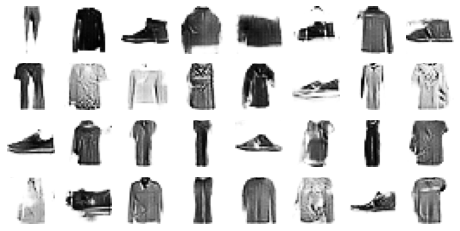

Epoch 17/50


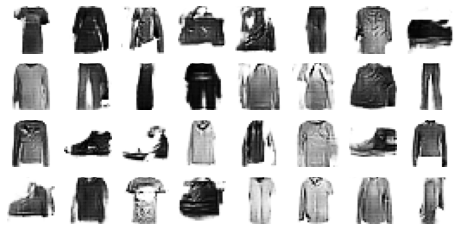

Epoch 18/50


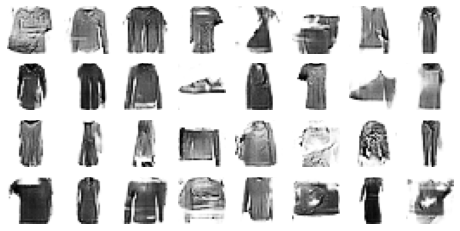

Epoch 19/50


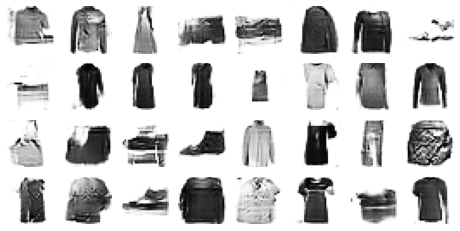

Epoch 20/50


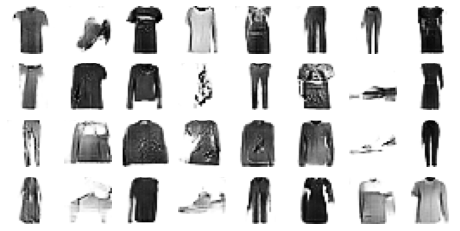

Epoch 21/50


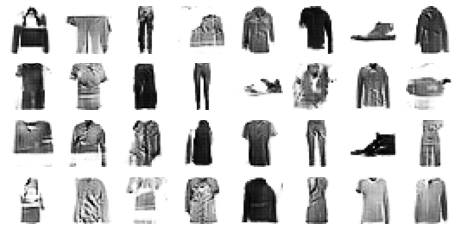

Epoch 22/50


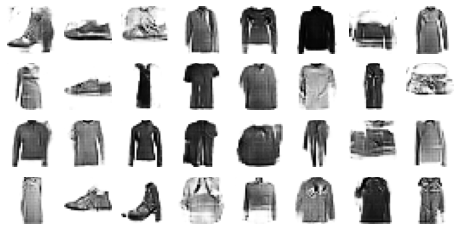

Epoch 23/50


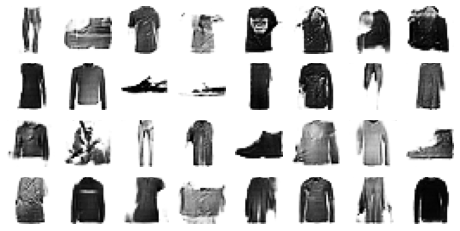

Epoch 24/50


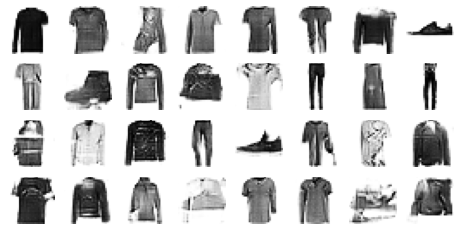

Epoch 25/50


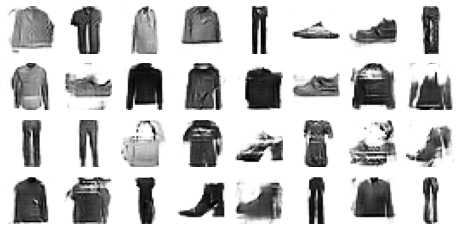

Epoch 26/50


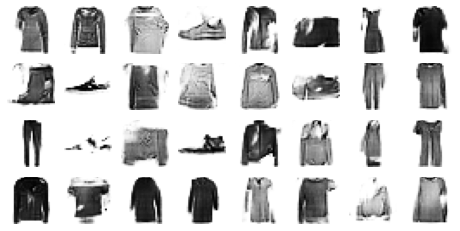

Epoch 27/50


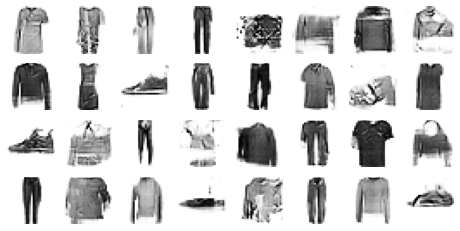

Epoch 28/50


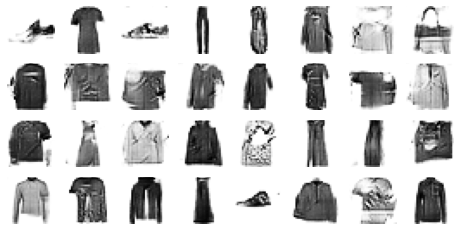

Epoch 29/50


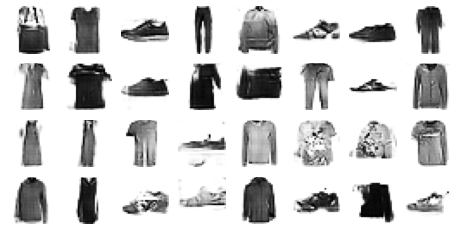

Epoch 30/50


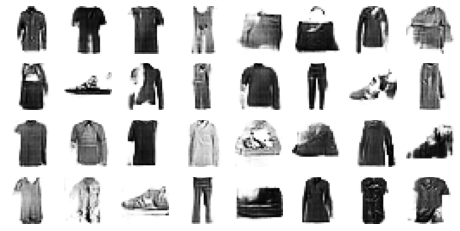

Epoch 31/50


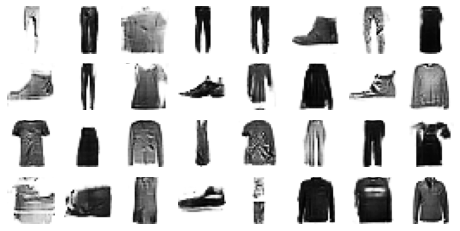

Epoch 32/50


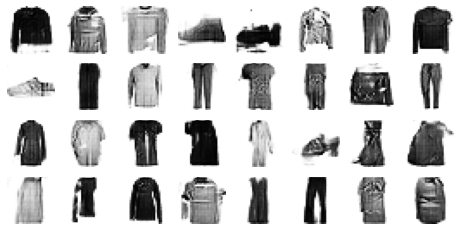

Epoch 33/50


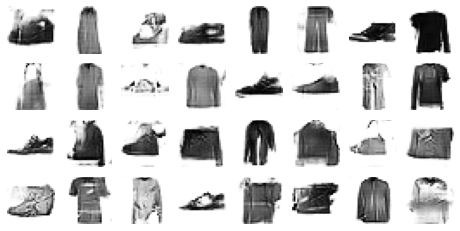

Epoch 34/50


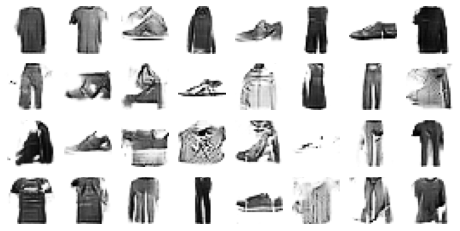

Epoch 35/50


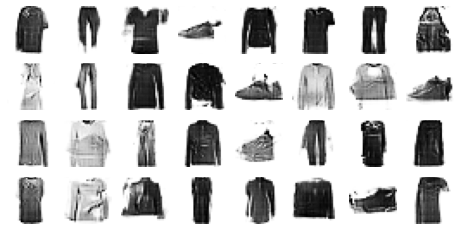

Epoch 36/50


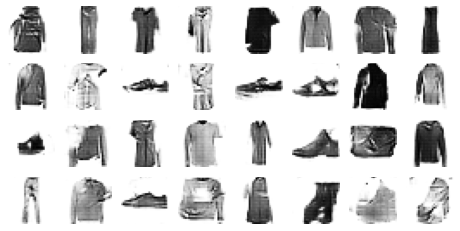

Epoch 37/50


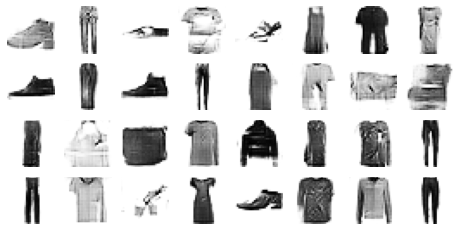

Epoch 38/50


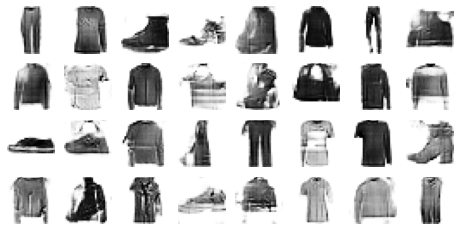

Epoch 39/50


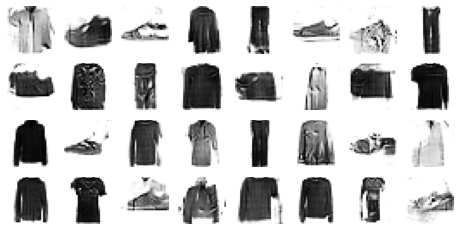

Epoch 40/50


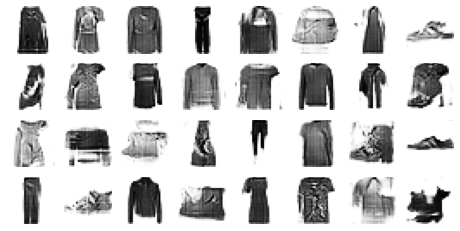

Epoch 41/50


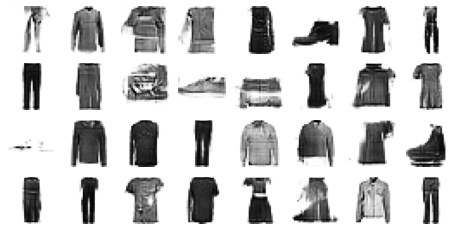

Epoch 42/50


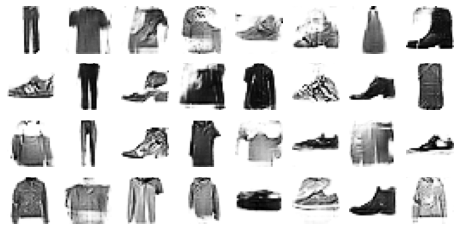

Epoch 43/50


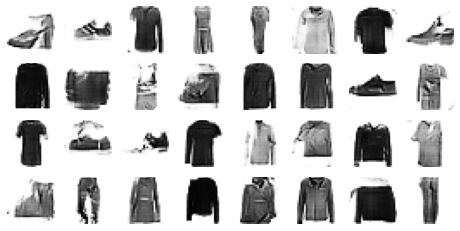

Epoch 44/50


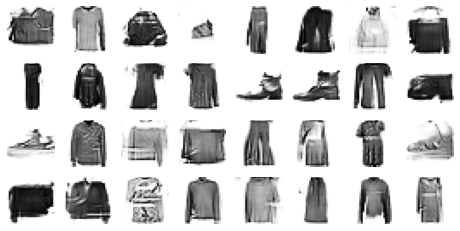

Epoch 45/50


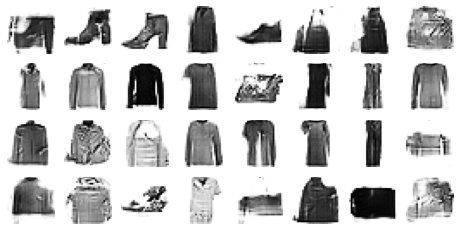

Epoch 46/50


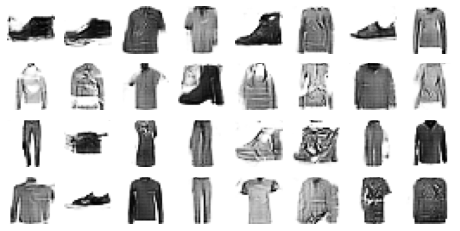

Epoch 47/50


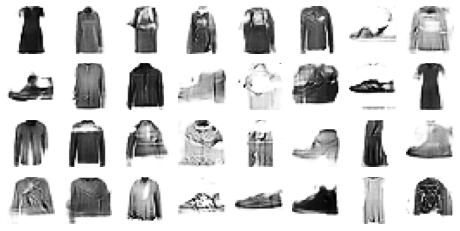

Epoch 48/50


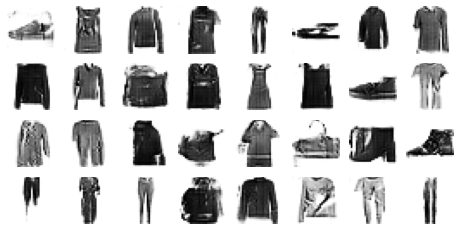

Epoch 49/50


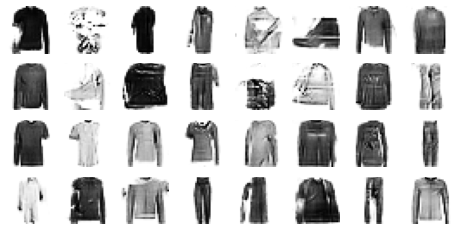

Epoch 50/50


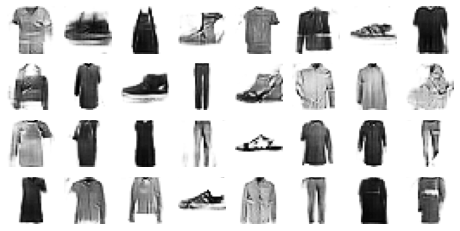

In [ ]:
train_gan(gan, dataset, batch_size, codings_size)

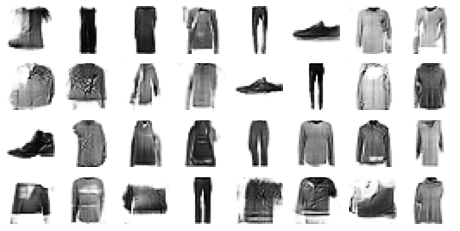

In [ ]:
tf.random.set_seed(42)
np.random.seed(42)

noise = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator(noise)
plot_multiple_images(generated_images, 8)